In [1]:
vertex_shader = """
#version 330

in vec2 in_position;

void main() {
    gl_Position = vec4(in_position, 0.0, 1.0);
}
"""

print(vertex_shader)


#version 330

in vec2 in_position;

void main() {
    gl_Position = vec4(in_position, 0.0, 1.0);
}



In [2]:
fragment_shader = """
#version 330

out vec4 fragColor;

void main() {
    fragColor = vec4(gl_FragCoord.xy / vec2(800.0, 600.0), 0.5, 1.0);
}
"""

print(fragment_shader)


#version 330

out vec4 fragColor;

void main() {
    fragColor = vec4(gl_FragCoord.xy / vec2(800.0, 600.0), 0.5, 1.0);
}



In [4]:
import moderngl
import numpy as np
from PIL import Image
from IPython.display import display

# Create an OpenGL context
ctx = moderngl.create_standalone_context()

# Compile shaders and create a program
program = ctx.program(
    vertex_shader=vertex_shader,
    fragment_shader=fragment_shader
)


In [5]:
# Define vertices for a full-screen quad
vertices = np.array([
    -1.0, -1.0,  # Bottom-left corner
     1.0, -1.0,  # Bottom-right corner
    -1.0,  1.0,  # Top-left corner
    -1.0,  1.0,  # Top-left corner
     1.0, -1.0,  # Bottom-right corner
     1.0,  1.0   # Top-right corner
], dtype='f4')

# Create a Vertex Buffer Object (VBO)
vbo = ctx.buffer(vertices.tobytes())


In [7]:
# Define how the buffer content is interpreted
vao = ctx.simple_vertex_array(program, vbo, 'in_position')
# Create an offscreen framebuffer
fbo = ctx.simple_framebuffer((800, 600))
fbo.use()

# Clear the framebuffer
ctx.clear(0.0, 0.0, 0.0, 1.0)

# Render the quad
vao.render()


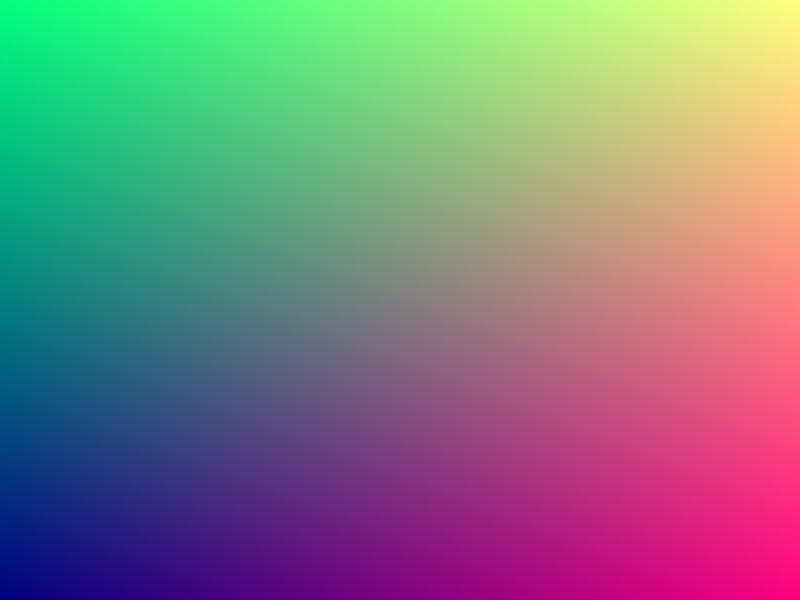

In [8]:
# Read the framebuffer content
data = fbo.read(components=3, alignment=1)
image = Image.frombytes('RGB', fbo.size, data).transpose(Image.FLIP_TOP_BOTTOM)

# Display the image in the notebook
display(image)


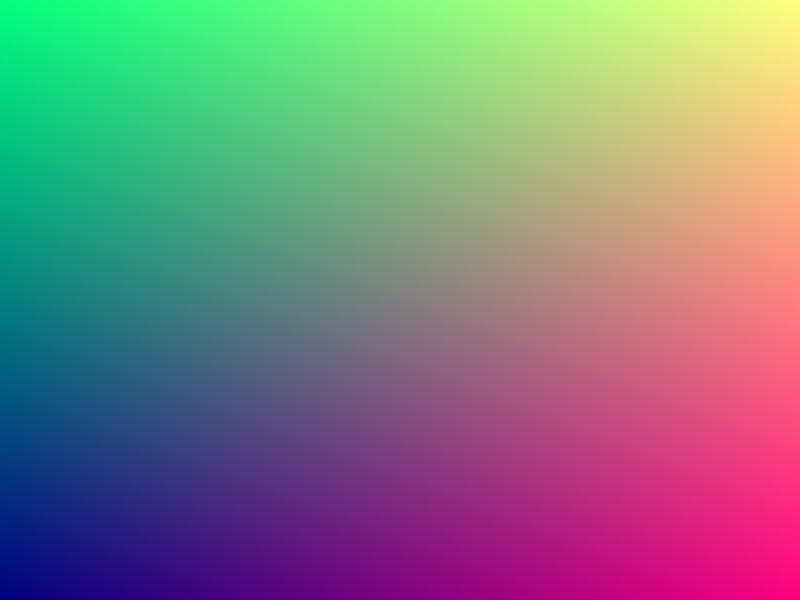

In [10]:
import time
from IPython.display import clear_output

# Update the fragment shader source
fragment_shader_source = '''
#version 330

uniform float iTime;

out vec4 fragColor;

void main() {
    vec2 uv = gl_FragCoord.xy / vec2(800.0, 600.0);
    float color = 0.5 + 0.5 * sin(iTime + uv.x * 10.0);
    fragColor = vec4(color, color, color, 1.0);
}
'''

# Recompile the program with the updated fragment shader
program = ctx.program(
    vertex_shader=vertex_shader,
    fragment_shader=fragment_shader_source
)

# Retrieve the uniform location
iTime = program['iTime']

# Start the animation loop
start_time = time.time()
for frame in range(60):
    # Update time
    current_time = time.time() - start_time
    iTime.value = current_time

    # Clear the framebuffer
    ctx.clear(0.0, 0.0, 0.0, 1.0)

    # Render the quad
    vao.render()

    # Read the framebuffer content
    data = fbo.read(components=3, alignment=1)
    image = Image.frombytes('RGB', fbo.size, data).transpose(Image.FLIP_TOP_BOTTOM)

    # Display the image
    clear_output(wait=True)
    display(image)

    # Control the frame rate
    time.sleep(0.033)  # Approximately 30 FPS


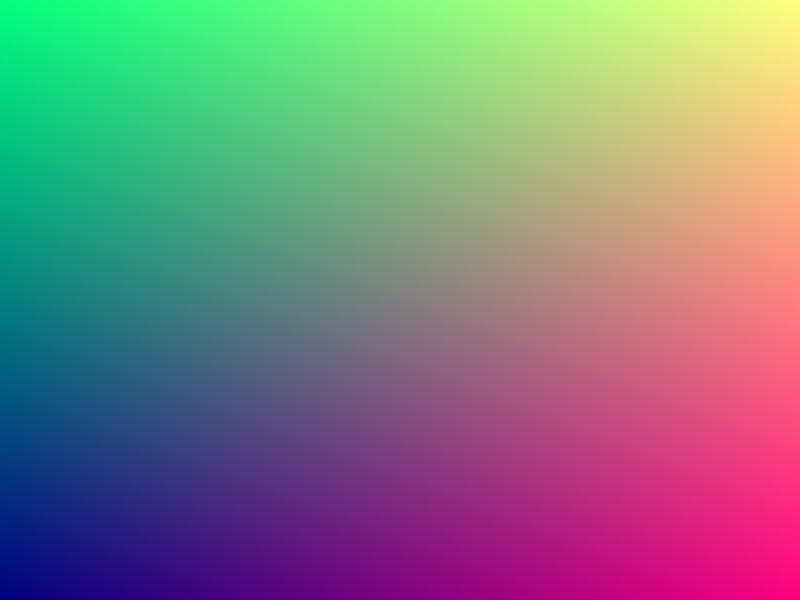

In [11]:
import time
from IPython.display import clear_output

# Update the fragment shader source
fragment_shader_source = '''
#version 330

uniform float iTime;

out vec4 fragColor;

void main() {
    vec2 uv = gl_FragCoord.xy / vec2(800.0, 600.0);
    float color = 0.5 + 0.5 * sin(iTime + uv.x * 10.0);
    fragColor = vec4(color, color, color, 1.0);
}
'''

# Recompile the program with the updated fragment shader
program = ctx.program(
    vertex_shader=vertex_shader,
    fragment_shader=fragment_shader_source
)

# Retrieve the uniform location
iTime = program['iTime']

# Start the animation loop
start_time = time.time()
for frame in range(60):
    # Update time
    current_time = time.time() - start_time
    iTime.value = current_time

    # Clear the framebuffer
    ctx.clear(0.0, 0.0, 0.0, 1.0)

    # Render the quad
    vao.render()

    # Read the framebuffer content
    data = fbo.read(components=3, alignment=1)
    image = Image.frombytes('RGB', fbo.size, data).transpose(Image.FLIP_TOP_BOTTOM)

    # Display the image
    clear_output(wait=True)
    display(image)

    # Control the frame rate
    time.sleep(0.033)  # Approximately 30 FPS


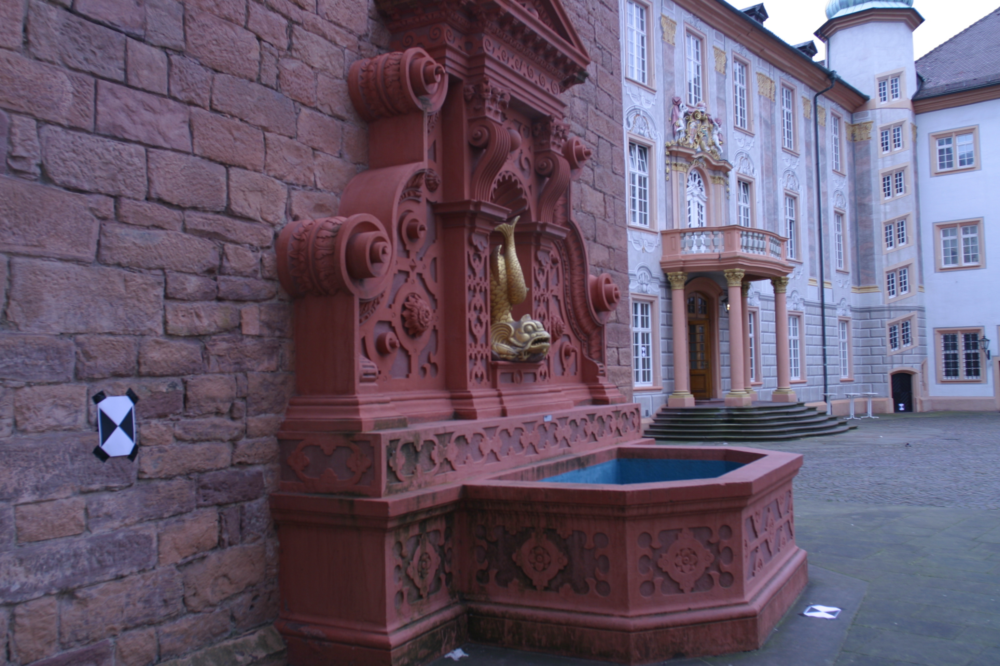

In [13]:
from PIL import Image
from IPython.display import display
img = Image.open('fountain.png')
display(img)

In [14]:
# Load an image using Pillow
texture_image = Image.open('fountain.png').convert('RGB')
texture_data = texture_image.transpose(Image.FLIP_TOP_BOTTOM).tobytes()

# Create a texture in moderngl
texture = ctx.texture(texture_image.size, 3, data=texture_data)
texture.build_mipmaps()


In [15]:
fragment_shader_source = """
#version 330

uniform sampler2D iTexture;

out vec4 fragColor;

void main() {
    vec2 uv = gl_FragCoord.xy / vec2(800.0, 600.0);
    fragColor = texture(iTexture, uv);
}
"""

# Recompile the shader program
program = ctx.program(
    vertex_shader=vertex_shader,
    fragment_shader=fragment_shader_source
)

# Bind the texture to texture unit 0
texture.use(location=0)

# Set the uniform to use texture unit 0
program['iTexture'] = 0


FloatSlider(value=7.4, description='iParam', max=10.0)

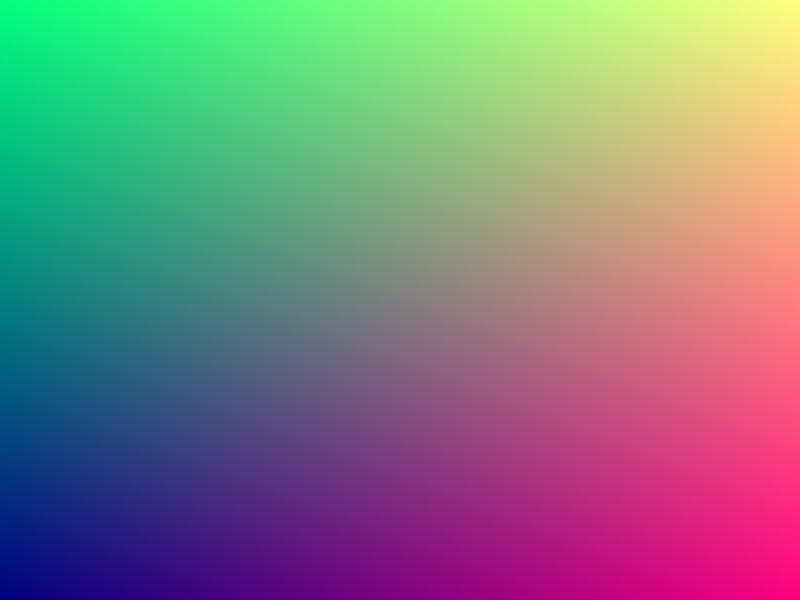

In [ ]:
import ipywidgets as widgets
from IPython.display import display

# Update the fragment shader to include a uniform variable
fragment_shader_source = '''
#version 330

uniform float iParam;

out vec4 fragColor;

void main() {
    vec2 uv = gl_FragCoord.xy / vec2(800.0, 600.0);
    float color = 0.5 + 0.5 * sin(iParam + uv.x * 10.0);
    fragColor = vec4(color, color, color, 1.0);
}
'''

# Recompile the program
program = ctx.program(
    vertex_shader=vertex_shader,
    fragment_shader=fragment_shader_source
)

iParam = program['iParam']

# Create a slider widget
slider = widgets.FloatSlider(min=0.0, max=10.0, step=0.1, value=0.0, description='iParam')

def update_shader(change):
    iParam.value = slider.value

    # Clear the framebuffer
    ctx.clear(0.0, 0.0, 0.0, 1.0)

    # Render the quad
    vao.render()

    # Read the framebuffer content
    data = fbo.read(components=3, alignment=1)
    image = Image.frombytes('RGB', fbo.size, data).transpose(Image.FLIP_TOP_BOTTOM)

    # Display the image
    clear_output(wait=True)
    display(slider)
    display(image)

# Attach the update function to the slider
slider.observe(update_shader, names='value')

# Display the slider and initial image
display(slider)
update_shader(None)
